Instalamos la librería de prophet en el cuaderno

In [4]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Clonamos el repositorio donde se encuentran los datos con los que vamos a trabajar

In [5]:
!git clone https://github.com/jesussantiyan/TFG.git

Cloning into 'TFG'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 17 (delta 1), reused 3 (delta 0), pack-reused 0
Unpacking objects: 100% (17/17), 428.22 KiB | 3.45 MiB/s, done.


Realizamos los importes necesarios usados durante todo el cuaderno

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

#Datos de un solo cliente

##Datos del primer cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [7]:
df_cliente = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente1.csv', sep=',')
df_cliente.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,126.0
1,2020-11-09 01:00:00,80.0
2,2020-11-09 02:00:00,49.0
3,2020-11-09 03:00:00,103.0
4,2020-11-09 04:00:00,122.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [8]:
df_cliente['FechaHora'] = pd.to_datetime(df_cliente['FechaHora'])

Renombramos las columnas con los nombres "ds" e "y" ya que prophet no admite otros nombres a la hora de hacer los modelos

In [9]:
df_clienteProphet = df_cliente.rename(columns={"FechaHora" : "ds", "Consumo" : "y"})

Creamos una instancia del modelo prophet y ajustamos el modelo pasandole el dataset previamente formado

In [60]:
modeloCliente = Prophet()
modeloCliente.fit(df_clienteProphet)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2kohscmf/w7xt9xn5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2kohscmf/9nrirm7h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79407', 'data', 'file=/tmp/tmp2kohscmf/w7xt9xn5.json', 'init=/tmp/tmp2kohscmf/9nrirm7h.json', 'output', 'file=/tmp/tmp2kohscmf/prophet_modelm57kcydo/prophet_model-20230528193012.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Creamos un dataset con las fechas utilizadas en el modelo más 90 fechas más (periods=90) de cara al futuro puestas en base a las que ya se utilizan

In [61]:
future = modeloCliente.make_future_dataframe(periods=90)
future.tail()

,ds
16357,2022-12-12 23:00:00
16358,2022-12-13 23:00:00
16359,2022-12-14 23:00:00
16360,2022-12-15 23:00:00
16361,2022-12-16 23:00:00


Creamos un modelo predictivo utilizando el dataset con las fechas futuras y un modelo previamente entrenado para realizar las predicciones. Una vez realizado obtenemos un dataset con las predicciones con las las columnas "ds" que indica la fecha, "yhat" que indica la predicción puntual y las columnas "yhat_lower" e "yhat_upper" que indican los límites superiores e inferiores de la predicción respectivamente

In [62]:
predCliente = modeloCliente.predict(future)
predCliente[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
16357,2022-12-12 23:00:00,214.268058,-114.774421,531.670225
16358,2022-12-13 23:00:00,210.905806,-82.968309,540.043986
16359,2022-12-14 23:00:00,220.396363,-85.764212,530.760026
16360,2022-12-15 23:00:00,249.808788,-71.196175,570.558188
16361,2022-12-16 23:00:00,265.105574,-43.920542,584.303025


Ponemos como indices del dataset inicial las fechas del dataset para poder realizar una visualización de los datos del mismo

In [13]:
df_cliente = df_cliente.set_index('FechaHora')
df_cliente.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es bastante irregular por lo que puede que no se trate de su vivienda habitual siendo usada durante periodos vacacionales como se puede ver en su consumo más elevado durante navidad o las vacaciones de verano

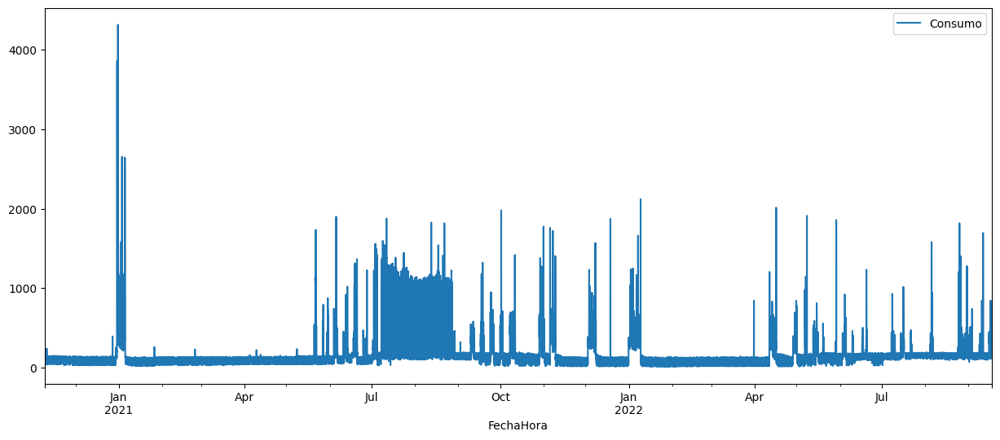

In [14]:
df_cliente.plot(figsize=(15, 6))
plt.show()

Visualizamos el modelo con las predicciones realizadas, siendo los puntos negros los datos iniciales y el trazo azul la predicción realizadas sobe los datos.

In [63]:
plot_plotly(modeloCliente, predCliente)

Visualizamos componentes de la prediccón como son la tendencia, y la estacionalidad tanto semanal como diaria

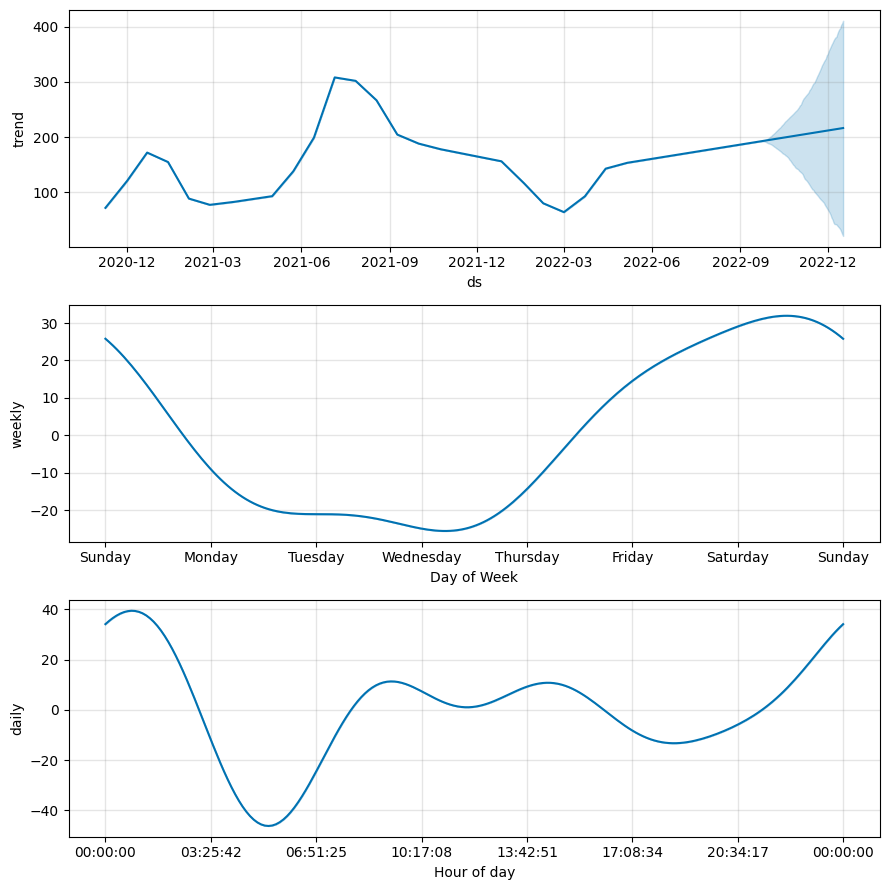

In [16]:
fig1 = modeloCliente.plot_components(predCliente)

##Datos del segundo cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [ ]:
df_cliente2 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente2.csv', sep=',')
df_cliente2.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,2.0
1,2020-11-09 01:00:00,28.0
2,2020-11-09 02:00:00,109.0
3,2020-11-09 03:00:00,106.0
4,2020-11-09 04:00:00,4.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [ ]:
df_cliente2['FechaHora'] = pd.to_datetime(df_cliente2['FechaHora'])

Renombramos las columnas con los nombres "ds" e "y" ya que prophet no admite otros nombres a la hora de hacer los modelos

In [ ]:
df_clienteProphet2 = df_cliente2.rename(columns={"FechaHora" : "ds", "Consumo" : "y"})

Creamos una instancia del modelo prophet y ajustamos el modelo pasandole el dataset previamente formado

In [ ]:
modeloCliente2 = Prophet()
modeloCliente2.fit(df_clienteProphet2)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkn99wex0/2g4knaz3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkn99wex0/gwlb9e7p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97598', 'data', 'file=/tmp/tmpkn99wex0/2g4knaz3.json', 'init=/tmp/tmpkn99wex0/gwlb9e7p.json', 'output', 'file=/tmp/tmpkn99wex0/prophet_model4av938i_/prophet_model-20230527205603.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:56:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:56:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Creamos un dataset con las fechas utilizadas en el modelo más 90 fechas más (periods=90) de cara al futuro puestas en base a las que ya se utilizan

In [ ]:
future2 = modeloCliente2.make_future_dataframe(periods=90)
future2.tail()

,ds
16357,2022-12-12 23:00:00
16358,2022-12-13 23:00:00
16359,2022-12-14 23:00:00
16360,2022-12-15 23:00:00
16361,2022-12-16 23:00:00


Creamos un modelo predictivo utilizando el dataset con las fechas futuras y un modelo previamente entrenado para realizar las predicciones. Una vez realizado obtenemos un dataset con las predicciones con las las columnas "ds" que indica la fecha, "yhat" que indica la predicción puntual y las columnas "yhat_lower" e "yhat_upper" que indican los límites superiores e inferiores de la predicción respectivamente

In [ ]:
predCliente2 = modeloCliente2.predict(future2)
predCliente2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
16357,2022-12-12 23:00:00,-37.995293,-302.285340,245.498106
16358,2022-12-13 23:00:00,-33.934657,-332.666467,246.246995
16359,2022-12-14 23:00:00,-30.626324,-303.917833,246.543191
16360,2022-12-15 23:00:00,-30.742048,-313.225336,238.220107
16361,2022-12-16 23:00:00,-38.627513,-315.428057,232.465603


Ponemos como indices del dataset inicial las fechas del dataset para poder realizar una visualización de los datos del mismo

In [ ]:
df_cliente2 = df_cliente2.set_index('FechaHora')
df_cliente2.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es bastante constante y alto durante todos los meses siendo más bajo el consumo en verano

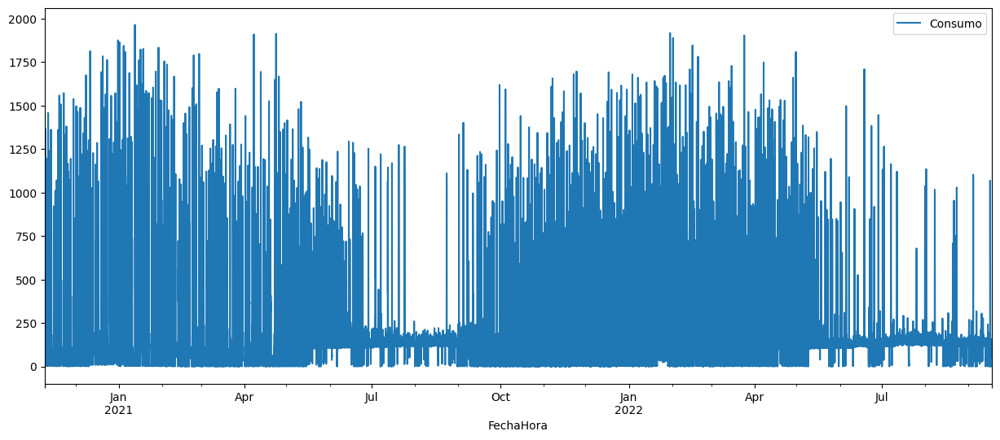

In [ ]:
df_cliente2.plot(figsize=(15, 6))
plt.show()

Visualizamos el modelo con las predicciones realizadas, siendo los puntos negros los datos iniciales y el trazo azul la predicción realizadas sobe los datos.

In [ ]:
plot_plotly(modeloCliente2, predCliente2)

Visualizamos componentes de la prediccón como son la tendencia, y la estacionalidad tanto semanal como diaria

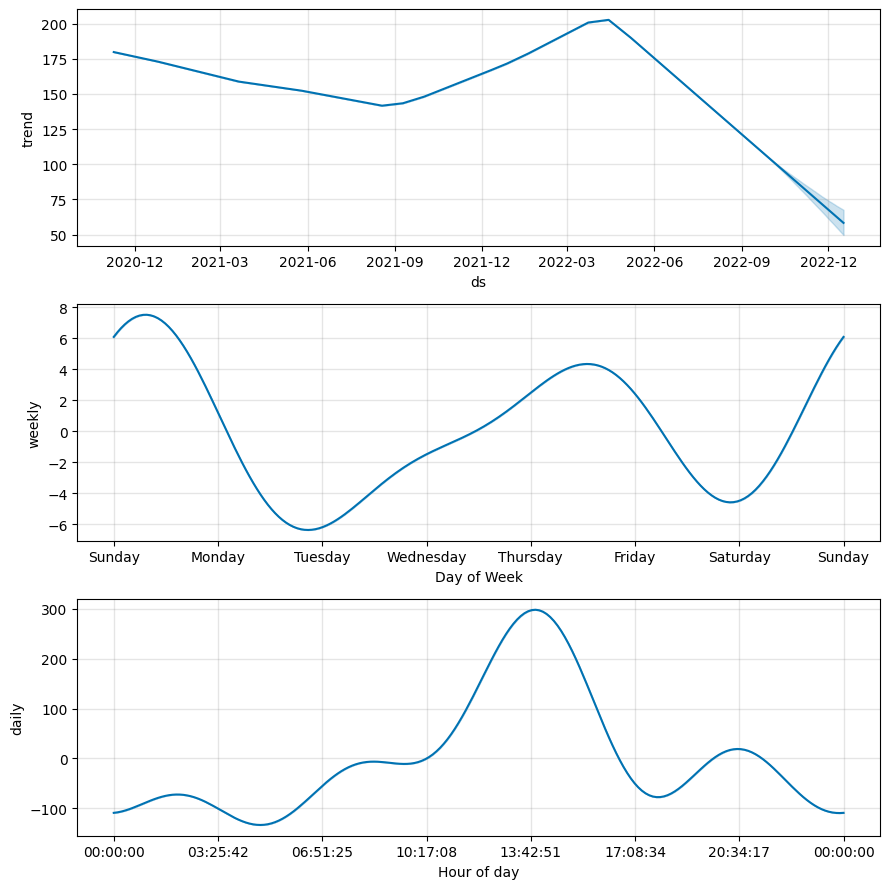

In [ ]:
fig1 = modeloCliente2.plot_components(predCliente2)

##Datos del tercer cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [4]:
df_cliente3 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente3.csv', sep=',')
df_cliente3.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,279.0
1,2020-11-09 01:00:00,96.0
2,2020-11-09 02:00:00,105.0
3,2020-11-09 03:00:00,105.0
4,2020-11-09 04:00:00,80.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [5]:
df_cliente3['FechaHora'] = pd.to_datetime(df_cliente3['FechaHora'])

Renombramos las columnas con los nombres "ds" e "y" ya que prophet no admite otros nombres a la hora de hacer los modelos

In [6]:
df_clienteProphet3 = df_cliente3.rename(columns={"FechaHora" : "ds", "Consumo" : "y"})

Creamos una instancia del modelo prophet y ajustamos el modelo pasandole el dataset previamente formado

In [7]:
modeloCliente3 = Prophet()
modeloCliente3.fit(df_clienteProphet3)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapvi7kc3/qc82pf43.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapvi7kc3/f4qnf4wv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78859', 'data', 'file=/tmp/tmpapvi7kc3/qc82pf43.json', 'init=/tmp/tmpapvi7kc3/f4qnf4wv.json', 'output', 'file=/tmp/tmpapvi7kc3/prophet_modelt38gcthz/prophet_model-20230528105912.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:59:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:59:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Creamos un dataset con las fechas utilizadas en el modelo más 90 fechas más (periods=90) de cara al futuro puestas en base a las que ya se utilizan

In [8]:
future3 = modeloCliente3.make_future_dataframe(periods=90)
future3.tail()

,ds
16357,2022-12-12 23:00:00
16358,2022-12-13 23:00:00
16359,2022-12-14 23:00:00
16360,2022-12-15 23:00:00
16361,2022-12-16 23:00:00


Creamos un modelo predictivo utilizando el dataset con las fechas futuras y un modelo previamente entrenado para realizar las predicciones. Una vez realizado obtenemos un dataset con las predicciones con las las columnas "ds" que indica la fecha, "yhat" que indica la predicción puntual y las columnas "yhat_lower" e "yhat_upper" que indican los límites superiores e inferiores de la predicción respectivamente

In [9]:
predCliente3 = modeloCliente3.predict(future3)
predCliente3[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
16357,2022-12-12 23:00:00,193.834317,42.559367,350.189471
16358,2022-12-13 23:00:00,195.306070,30.353865,355.671388
16359,2022-12-14 23:00:00,196.039935,14.329794,339.788912
16360,2022-12-15 23:00:00,201.263485,40.311131,365.112648
16361,2022-12-16 23:00:00,198.310923,22.200890,354.229775


Ponemos como indices del dataset inicial las fechas del dataset para poder realizar una visualización de los datos del mismo

In [10]:
df_cliente3 = df_cliente3.set_index('FechaHora')
df_cliente3.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es bastante más alto durante los meses más frios y más baja durante los meses de más calor

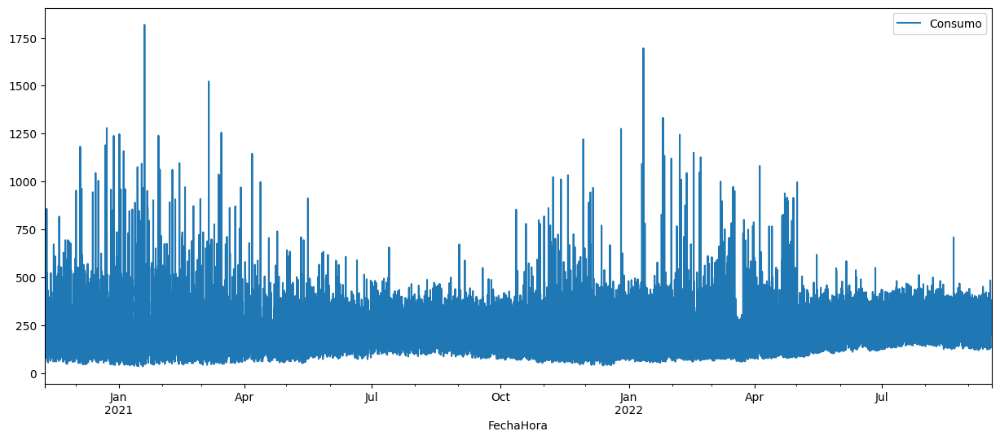

In [11]:
df_cliente3.plot(figsize=(15, 6))
plt.show()

Visualizamos el modelo con las predicciones realizadas, siendo los puntos negros los datos iniciales y el trazo azul la predicción realizadas sobe los datos.

In [12]:
plot_plotly(modeloCliente3, predCliente3)

Visualizamos componentes de la prediccón como son la tendencia, y la estacionalidad tanto semanal como diaria

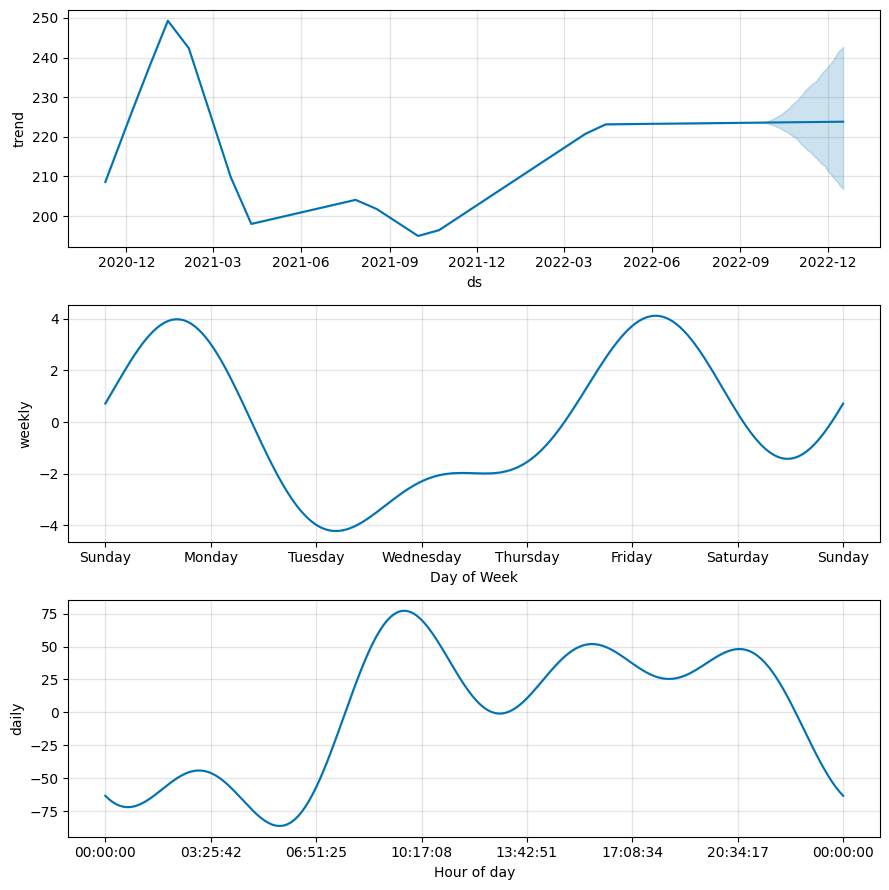

In [13]:
fig1 = modeloCliente3.plot_components(predCliente3)

##Datos cuarto cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [14]:
df_cliente4 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente4.csv', sep=',')
df_cliente4.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,372.0
1,2020-11-09 01:00:00,314.0
2,2020-11-09 02:00:00,313.0
3,2020-11-09 03:00:00,293.0
4,2020-11-09 04:00:00,259.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [15]:
df_cliente4['FechaHora'] = pd.to_datetime(df_cliente4['FechaHora'])

Renombramos las columnas con los nombres "ds" e "y" ya que prophet no admite otros nombres a la hora de hacer los modelos

In [16]:
df_clienteProphet4 = df_cliente4.rename(columns={"FechaHora" : "ds", "Consumo" : "y"})

Creamos una instancia del modelo prophet y ajustamos el modelo pasandole el dataset previamente formado

In [17]:
modeloCliente4 = Prophet()
modeloCliente4.fit(df_clienteProphet4)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapvi7kc3/h875zdp0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapvi7kc3/1ihptu0b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24911', 'data', 'file=/tmp/tmpapvi7kc3/h875zdp0.json', 'init=/tmp/tmpapvi7kc3/1ihptu0b.json', 'output', 'file=/tmp/tmpapvi7kc3/prophet_modelwd9l5udu/prophet_model-20230528110758.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:07:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:08:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Creamos un dataset con las fechas utilizadas en el modelo más 90 fechas más (periods=90) de cara al futuro puestas en base a las que ya se utilizan

In [18]:
future4 = modeloCliente4.make_future_dataframe(periods=90)
future4.tail()

,ds
16357,2022-12-12 23:00:00
16358,2022-12-13 23:00:00
16359,2022-12-14 23:00:00
16360,2022-12-15 23:00:00
16361,2022-12-16 23:00:00


Creamos un modelo predictivo utilizando el dataset con las fechas futuras y un modelo previamente entrenado para realizar las predicciones. Una vez realizado obtenemos un dataset con las predicciones con las las columnas "ds" que indica la fecha, "yhat" que indica la predicción puntual y las columnas "yhat_lower" e "yhat_upper" que indican los límites superiores e inferiores de la predicción respectivamente

In [20]:
predCliente4 = modeloCliente4.predict(future4)
predCliente4[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
16357,2022-12-12 23:00:00,807.161090,285.492744,1267.764346
16358,2022-12-13 23:00:00,809.689246,338.947829,1344.819124
16359,2022-12-14 23:00:00,813.408781,314.497996,1334.124117
16360,2022-12-15 23:00:00,802.338415,298.321746,1303.911035
16361,2022-12-16 23:00:00,823.051785,340.437851,1322.221348


Ponemos como indices del dataset inicial las fechas del dataset para poder realizar una visualización de los datos del mismo

In [21]:
df_cliente4 = df_cliente4.set_index('FechaHora')
df_cliente4.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es bastante constante durante todo el año

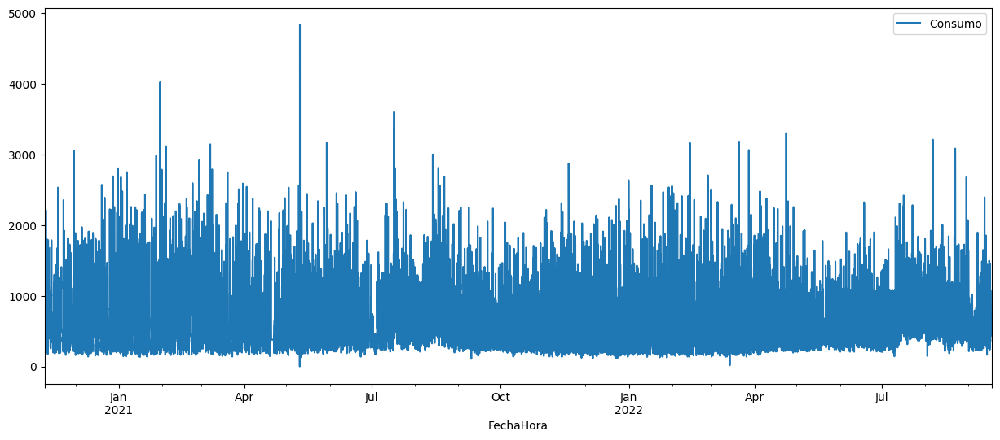

In [22]:
df_cliente4.plot(figsize=(15, 6))
plt.show()

Visualizamos el modelo con las predicciones realizadas, siendo los puntos negros los datos iniciales y el trazo azul la predicción realizadas sobe los datos.

In [23]:
plot_plotly(modeloCliente4, predCliente4)

Visualizamos componentes de la prediccón como son la tendencia, y la estacionalidad tanto semanal como diaria

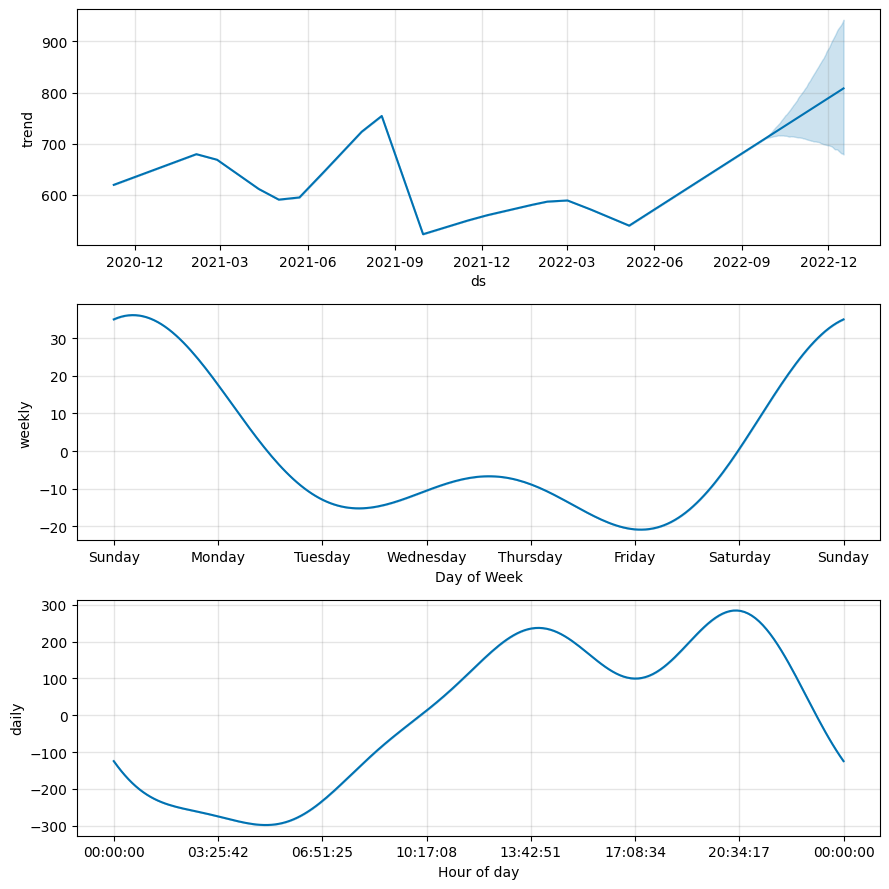

In [24]:
fig1 = modeloCliente4.plot_components(predCliente4)

##Datos del quinto cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [25]:
df_cliente5 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente5.csv', sep=',')
df_cliente5.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,69.0
1,2020-11-09 01:00:00,57.0
2,2020-11-09 02:00:00,43.0
3,2020-11-09 03:00:00,40.0
4,2020-11-09 04:00:00,35.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [26]:
df_cliente5['FechaHora'] = pd.to_datetime(df_cliente5['FechaHora'])

Renombramos las columnas con los nombres "ds" e "y" ya que prophet no admite otros nombres a la hora de hacer los modelos

In [27]:
df_clienteProphet5 = df_cliente5.rename(columns={"FechaHora" : "ds", "Consumo" : "y"})

Creamos una instancia del modelo prophet y ajustamos el modelo pasandole el dataset previamente formado

In [28]:
modeloCliente5 = Prophet()
modeloCliente5.fit(df_clienteProphet5)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapvi7kc3/xzpv0x40.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapvi7kc3/73jmji9j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7434', 'data', 'file=/tmp/tmpapvi7kc3/xzpv0x40.json', 'init=/tmp/tmpapvi7kc3/73jmji9j.json', 'output', 'file=/tmp/tmpapvi7kc3/prophet_modeludoxomva/prophet_model-20230528111719.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:17:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:17:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Creamos un dataset con las fechas utilizadas en el modelo más 90 fechas más (periods=90) de cara al futuro puestas en base a las que ya se utilizan

In [29]:
future5 = modeloCliente5.make_future_dataframe(periods=90)
future5.tail()

,ds
16357,2022-12-12 23:00:00
16358,2022-12-13 23:00:00
16359,2022-12-14 23:00:00
16360,2022-12-15 23:00:00
16361,2022-12-16 23:00:00


Creamos un modelo predictivo utilizando el dataset con las fechas futuras y un modelo previamente entrenado para realizar las predicciones. Una vez realizado obtenemos un dataset con las predicciones con las las columnas "ds" que indica la fecha, "yhat" que indica la predicción puntual y las columnas "yhat_lower" e "yhat_upper" que indican los límites superiores e inferiores de la predicción respectivamente

In [30]:
predCliente5 = modeloCliente5.predict(future5)
predCliente5[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
16357,2022-12-12 23:00:00,133.583884,-21.475550,292.767824
16358,2022-12-13 23:00:00,133.315315,-41.581803,299.823179
16359,2022-12-14 23:00:00,138.192945,-17.297736,296.162302
16360,2022-12-15 23:00:00,128.250395,-39.267295,287.873321
16361,2022-12-16 23:00:00,119.816909,-46.877601,270.945175


Ponemos como indices del dataset inicial las fechas del dataset para poder realizar una visualización de los datos del mismo

In [31]:
df_cliente5 = df_cliente5.set_index('FechaHora')
df_cliente5.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es elevado durante los meses más frios y más bajo en los meses cálidos

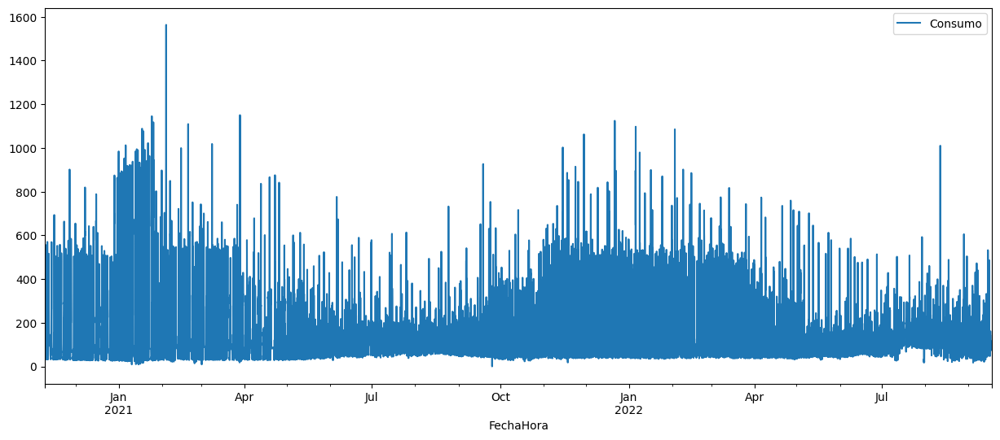

In [32]:
df_cliente5.plot(figsize=(15, 6))
plt.show()

Visualizamos el modelo con las predicciones realizadas, siendo los puntos negros los datos iniciales y el trazo azul la predicción realizadas sobe los datos.

In [33]:
plot_plotly(modeloCliente5, predCliente5)

Visualizamos componentes de la prediccón como son la tendencia, y la estacionalidad tanto semanal como diaria

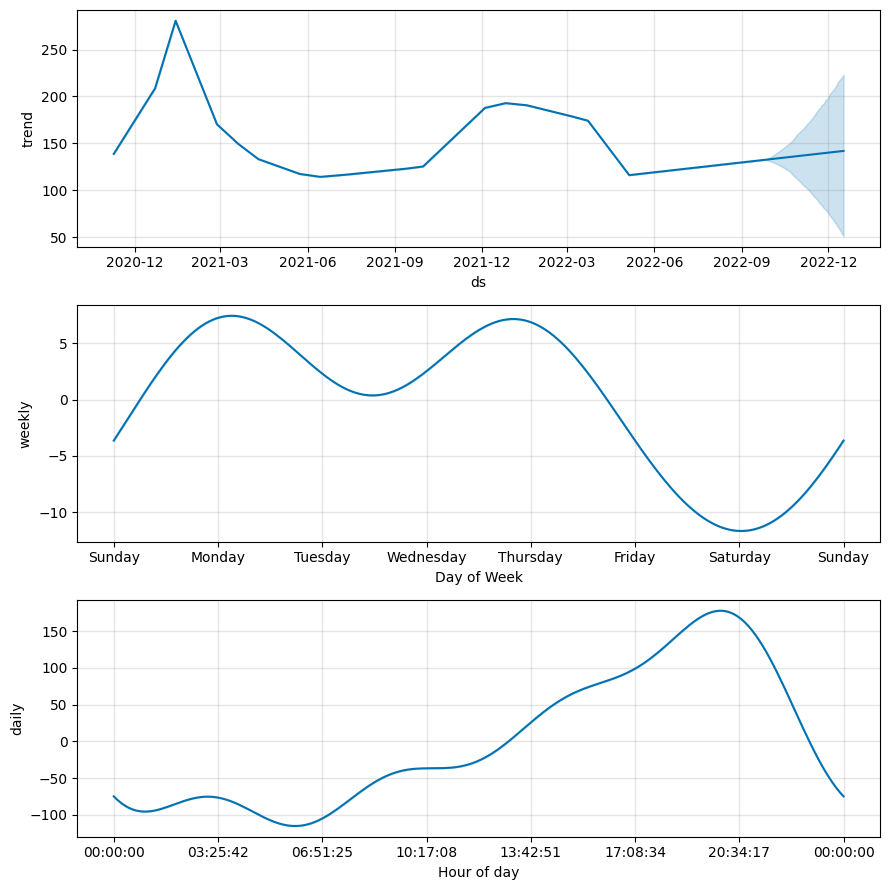

In [34]:
fig1 = modeloCliente5.plot_components(predCliente5)

#Datos totales de un centro

Leemos el archivo .csv que contiene los datos del centro de transformación y quitamos algunas columnas sobrantes que no interesan para hacer la serie temporal 

In [ ]:
df_centro = pd.read_csv('/content/TFG/ConsumoHorario_ORM5965138300 .csv', sep=',')
df_centro = df_centro.drop(['id', 'Cnt'], axis = 1)
df_centro.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,46000.0
1,2020-11-09 01:00:00,34000.0
2,2020-11-09 02:00:00,27000.0
3,2020-11-09 03:00:00,25000.0
4,2020-11-09 04:00:00,22000.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [ ]:
df_centro['FechaHora'] = pd.to_datetime(df_centro['FechaHora'])

Renombramos las columnas con los nombres "ds" e "y" ya que prophet no admite otros nombres a la hora de hacer los modelos

In [ ]:
df_centroProphet = df_centro.rename(columns={"FechaHora" : "ds", "Consumo" : "y"})

Creamos una instancia del modelo prophet y ajustamos el modelo pasandole el dataset previamente formado

In [ ]:
modeloCentro = Prophet()
modeloCentro.fit(df_centroProphet)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkn99wex0/h6h_o50x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkn99wex0/sayd3ys9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44333', 'data', 'file=/tmp/tmpkn99wex0/h6h_o50x.json', 'init=/tmp/tmpkn99wex0/sayd3ys9.json', 'output', 'file=/tmp/tmpkn99wex0/prophet_modelu2bxb80q/prophet_model-20230527194603.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:46:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:46:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Creamos un dataset con las fechas utilizadas en el modelo más 90 fechas más (periods=90) de cara al futuro puestas en base a las que ya se utilizan

In [ ]:
futureCentro = modeloCentro.make_future_dataframe(periods=90)
futureCentro.tail()

,ds
16357,2022-12-12 23:00:00
16358,2022-12-13 23:00:00
16359,2022-12-14 23:00:00
16360,2022-12-15 23:00:00
16361,2022-12-16 23:00:00


Creamos un modelo predictivo utilizando el dataset con las fechas futuras y un modelo previamente entrenado para realizar las predicciones. Una vez realizado obtenemos un dataset con las predicciones con las las columnas "ds" que indica la fecha, "yhat" que indica la predicción puntual y las columnas "yhat_lower" e "yhat_upper" que indican los límites superiores e inferiores de la predicción respectivamente

In [ ]:
predCentro = modeloCentro.predict(futureCentro)
predCentro[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
16357,2022-12-12 23:00:00,51918.425733,26879.294786,78944.448802
16358,2022-12-13 23:00:00,51902.016862,28029.837371,78994.989647
16359,2022-12-14 23:00:00,51758.275526,27366.569696,78688.163244
16360,2022-12-15 23:00:00,51944.162280,26638.657968,80861.754312
16361,2022-12-16 23:00:00,52211.816169,26968.797449,80799.975459


Ponemos como indices del dataset inicial las fechas del dataset para poder realizar una visualización de los datos del mismo

In [ ]:
df_centro = df_centro.set_index('FechaHora')
df_centro.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver en los meses de invierno se consume más energía que en los meses de primavera

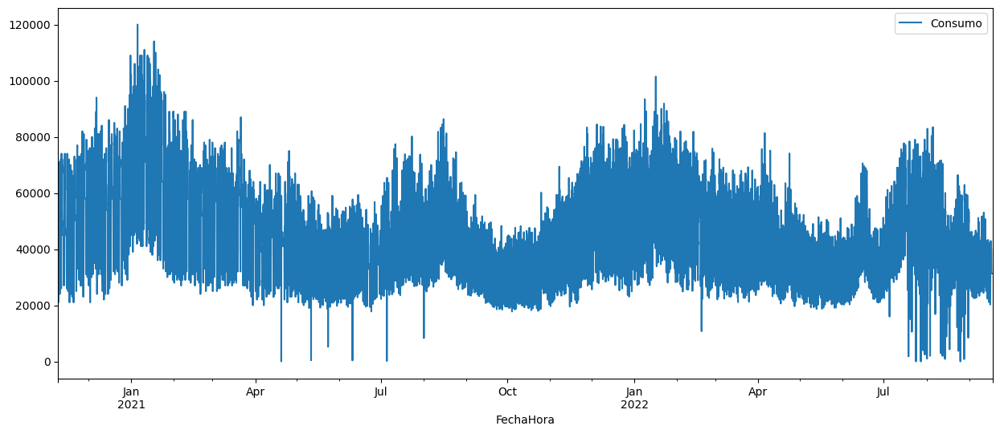

In [ ]:
df_centro.plot(figsize=(15, 6))
plt.show()

Visualizamos el modelo con las predicciones realizadas, siendo los puntos negros los datos iniciales y el trazo azul la predicción realizadas sobe los datos.

In [ ]:
plot_plotly(modeloCentro, predCentro)

Visualizamos componentes de la prediccón como son la tendencia, y la estacionalidad tanto semanal como diaria

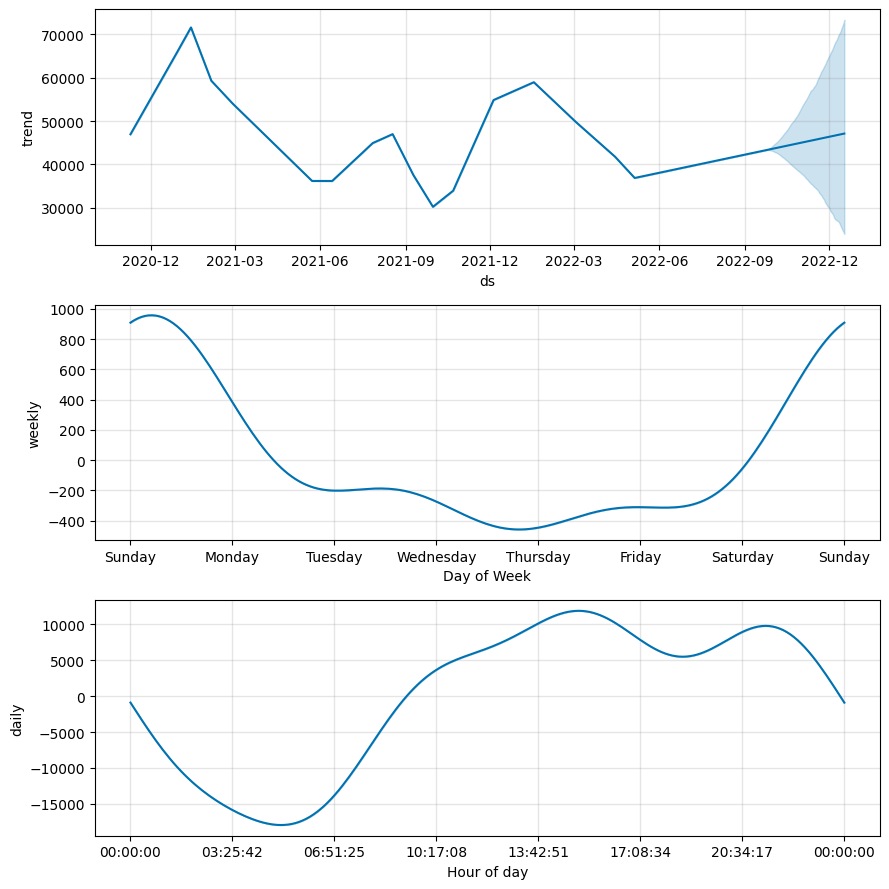

In [ ]:
fig1 = modeloCentro.plot_components(predCentro)